In [1]:
import os
import pandas as pd
import numpy as np
import tensorflow as tf
from tqdm import tqdm
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import cv2
# Data Preparation
data = {'image_path': [], 'mask_path': [], 'label': []}

root_dir = '/kaggle/input/wcebleedgen/WCEBleedGen'
for class_dir in ['bleeding', 'non-bleeding']:
    if(class_dir=='bleeding'):
        image_dir = os.path.join(root_dir, class_dir, 'Images')
        mask_dir = os.path.join(root_dir, class_dir, 'Annotations')
    else:
        image_dir = os.path.join(root_dir, class_dir, 'images')
        mask_dir = os.path.join(root_dir, class_dir, 'annotation')
        

    for image_file in tqdm(os.listdir(image_dir)):
        image_path = os.path.join(image_dir, image_file)
        mask_file = 'ann-' + ' ' + image_file.split('.')[0].split(' ')[-1] + '.png'
        mask_path = os.path.join(mask_dir, mask_file)
        label = 1 if class_dir == 'bleeding' else 0

        data['image_path'].append(image_path)
        data['mask_path'].append(mask_path)
        data['label'].append(label)

df = pd.DataFrame(data)

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
100%|██████████| 1309/1309 [00:00<00:00, 293193.63it/s]


In [2]:
img = cv2.imread(df['image_path'][5],cv2.IMREAD_COLOR)
img.shape

(224, 224, 3)

In [3]:
import cv2
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

IMG_SHAPE = (224,224)

def Grahams_method(img, sigmaX=10):   
    """
    Create circular crop around image centre    
    """
    #img, height_offset, width_offset = crop_image_from_gray(img)
    #img = crop_image_from_gray(img)
    #plt.imshow(img)
    img = cv2.addWeighted(img,4,cv2.GaussianBlur(img, (0,0), sigmaX), -4, 128)

    # return img, height_offset, width_offset
    return img

scaler=MinMaxScaler()

def preprocess_img(img,sigmaX=10):
    image_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    image_ = cv2.resize(image_rgb, IMG_SHAPE)
    p = Grahams_method(image_, 10)
    shape = image_.shape
    p = scaler.fit_transform(p.reshape(-1, shape[-1])).reshape(shape)
    return p
def preprocess_mask(mask):
    mask_ = cv2.resize(mask, IMG_SHAPE)
    mask_ = (mask_ > 0).astype(np.uint8)
    return mask
    

def plot_variants(df, label, k):
    # Filter the dataframe based on the specified label
    filtered_df = df[df['label'] == label]

    for i in range(min(k, len(filtered_df))):
        image = cv2.imread(filtered_df['image_path'].iloc[i], cv2.IMREAD_COLOR)
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image_ = cv2.resize(image_rgb, IMG_SHAPE)
        p = Grahams_method(image_, 10)
        shape = image_.shape
        image_ = scaler.fit_transform(image_.reshape(-1, shape[-1])).reshape(shape)

        mask = cv2.imread(filtered_df['mask_path'].iloc[i], cv2.IMREAD_GRAYSCALE)
        mask_ = preprocess_mask(mask)
        fig, axes = plt.subplots(1, 6, figsize=(30, 7))  # Adjust figsize as needed

        # Plot each image on its corresponding subplot
        axes[0].imshow(image_[:, :, 0])
        axes[0].set_title('red')

        axes[1].imshow(image_[:, :, 1])
        axes[1].set_title('green')

        axes[2].imshow(image_[:, :, 2])
        axes[2].set_title('blue')

        axes[3].imshow(image_)
        axes[3].set_title('Original')

        axes[4].imshow(p)
        axes[4].set_title('processed')

        axes[5].imshow(mask, cmap='gray')
        axes[5].set_title('mask')

        # Remove axis labels and ticks
        for ax in axes:
            ax.axis('off')

        # Adjust spacing and display the plot
        plt.tight_layout()
        plt.show()
        

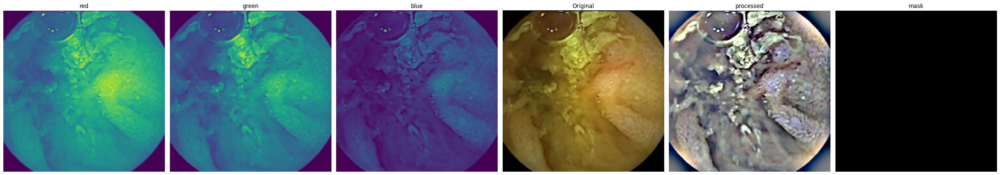

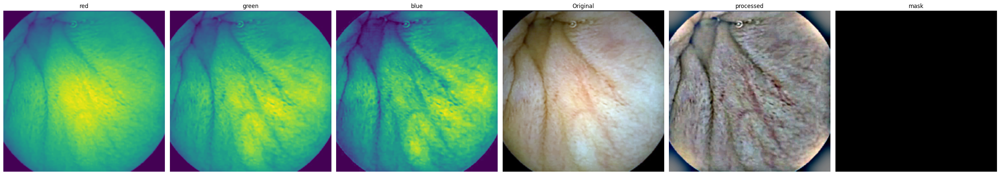

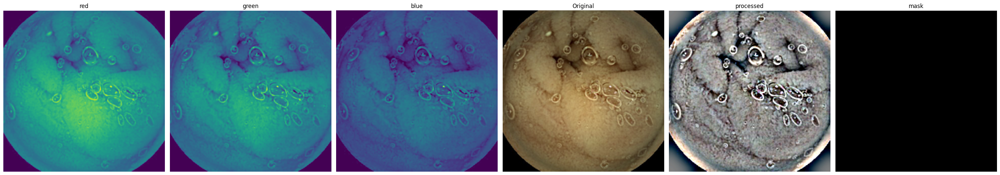

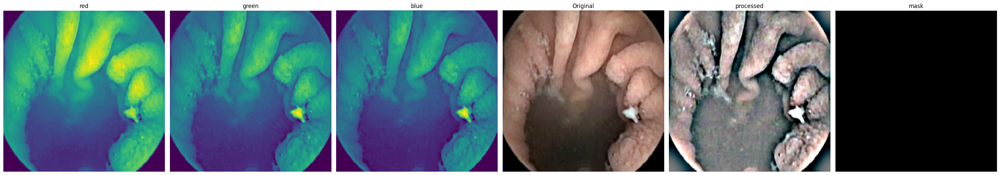

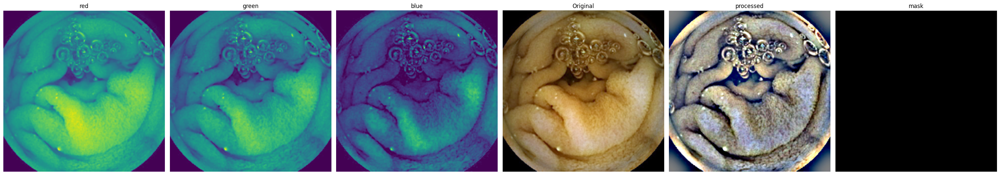

In [4]:
plot_variants(df,label=0,k=5)

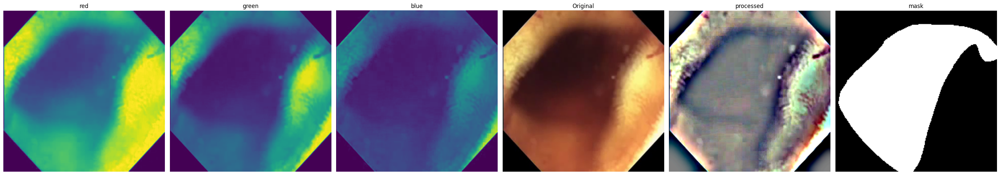

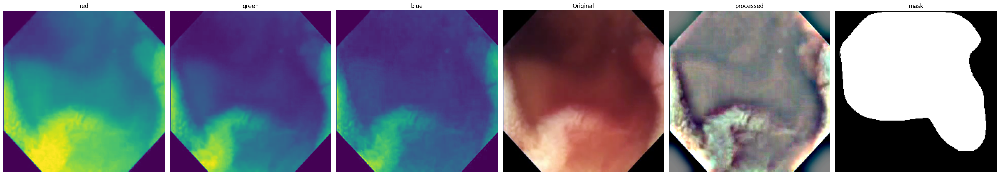

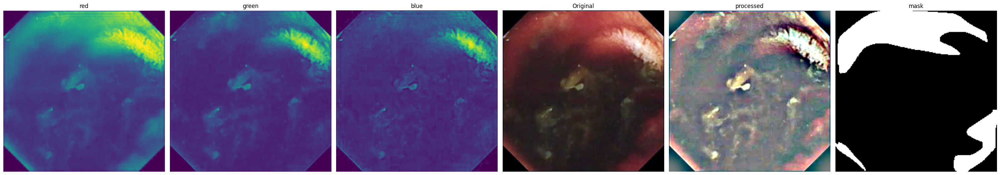

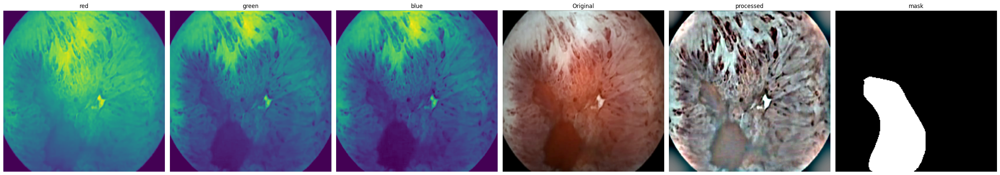

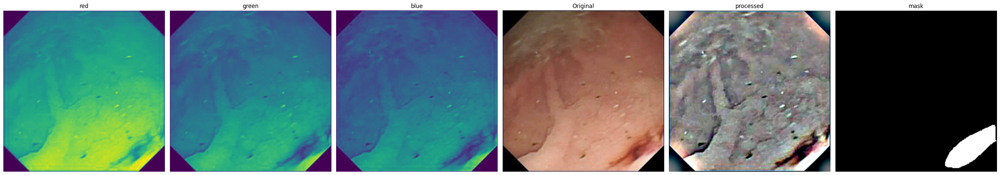

In [5]:
plot_variants(df,label=1,k=5)

In [6]:
import pandas as pd
from sklearn.model_selection import train_test_split

# Split the DataFrame into two DataFrames based on the labels
df_label_0 = df[df['label'] == 0]
df_label_1 = df[df['label'] == 1]

# Split both label DataFrames into training and validation sets
train_df_label_0, val_df_label_0 = train_test_split(df_label_0, test_size=0.5, random_state=42)
train_df_label_1, val_df_label_1 = train_test_split(df_label_1, test_size=0.5, random_state=42)

# Concatenate the training and validation sets for both labels
train_df = pd.concat([train_df_label_0, train_df_label_1])
val_df = pd.concat([val_df_label_0, val_df_label_1])

# Shuffle the training and validation sets
train_df = train_df.sample(frac=1, random_state=42).reset_index(drop=True)
val_df = val_df.sample(frac=1, random_state=42).reset_index(drop=True)

# Now, train_df and val_df contain 50% of both labels in their respective sets


In [7]:
!pip install albumentations

In [8]:
import albumentations as A

# Define the augmentation transformations using Albumentations
augmentation_transform = A.Compose([
    A.HorizontalFlip(p=0.5),   # Random horizontal flip with a probability of 50%
    A.Rotate(limit=45, p=0.5),  # Random rotation within the range of -45 to 45 degrees
    A.RandomContrast(limit=0.2, p=0.5),  # Random contrast adjustment
    A.VerticalFlip(0.5)
    #A.ElasticTransform(alpha=6, sigma=60 * 0.05, alpha_affine=10 * 0.03, p=0.2),  # Elastic deformation
    #A.Resize(height=224, width=224),  # Resize to the desired input size
    #A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),  # Standardize pixel values
])

# Create a custom data generator with Albumentations augmentations
def custom_data_generator(df, batch_size, shuffle=True):
    num_samples = len(df)
    while True:
        if shuffle:
            df = df.sample(frac=1).reset_index(drop=True)  # Shuffle DataFrame
        for offset in range(0, num_samples, batch_size):
            batch_df = df.iloc[offset:offset+batch_size]

            # Load and preprocess images
            X = []
            y = []
            for idx, row in batch_df.iterrows():
                img = cv2.imread(row['image_path'], cv2.IMREAD_COLOR)
                img = preprocess_img(img)

                # Apply Albumentations augmentation
                augmented = augmentation_transform(image=img)
                img = augmented['image']

                X.append(img)
                y.append(row['label'])
            
            X = np.array(X)
            y = np.array(y)
            yield X, y

/opt/conda/lib/python3.10/site-packages/albumentations/augmentations/transforms.py:1284: FutureWarning: RandomContrast has been deprecated. Please use RandomBrightnessContrast
  warnings.warn(


In [9]:
def preprocess_img(img,sigmaX=10):
    image_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image_rgb, IMG_SHAPE)
    #image = Grahams_method(image, 10)
    shape = image.shape
    image = scaler.fit_transform(image.reshape(-1, shape[-1])).reshape(shape)
    return image

Sample 1:
True Label: 0 (Bleeding: False, Non-Bleeding: True)
1.0


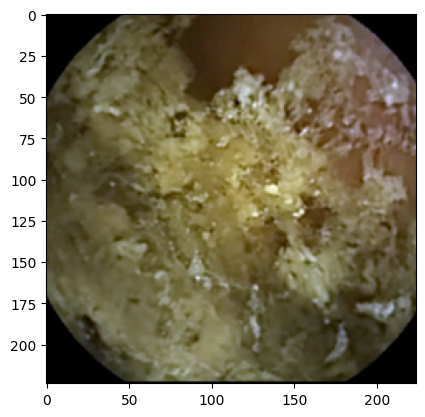

Sample 2:
True Label: 1 (Bleeding: True, Non-Bleeding: False)
0.9975183823529412


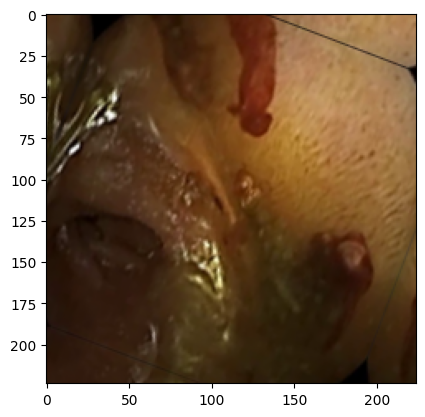

Sample 3:
True Label: 1 (Bleeding: True, Non-Bleeding: False)
1.0


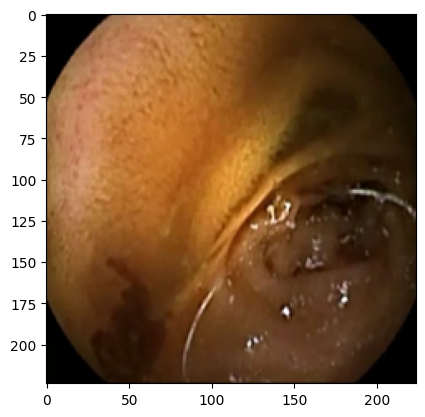

Sample 4:
True Label: 1 (Bleeding: True, Non-Bleeding: False)
1.0


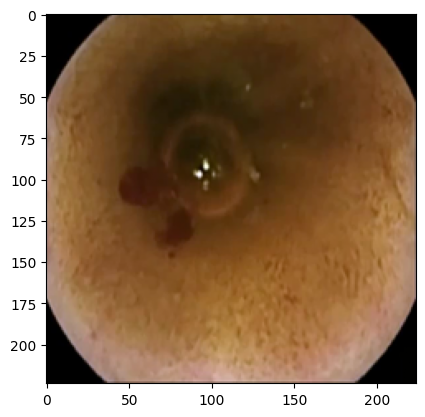

Sample 5:
True Label: 1 (Bleeding: True, Non-Bleeding: False)
0.9139253497123718


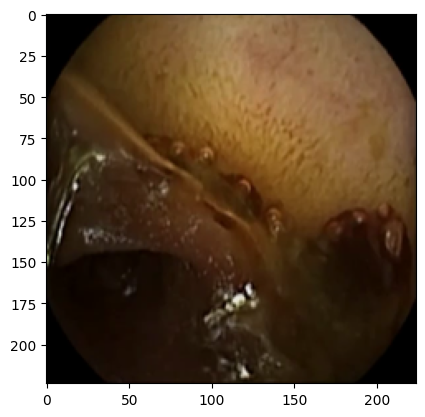

In [10]:
# Assuming you have already defined the custom data generator and have loaded the trained model
import numpy as np

# Define the batch size
batch_size = 5  # You can change this to any batch size you want

# Generate random samples from the custom data generator
random_samples = next(custom_data_generator(train_df, batch_size, shuffle=True))
# Extract images and labels from the generated batch
X_batch, y_batch = random_samples


# Display the batch of images and their corresponding true and predicted labels
for i in range(batch_size):
    image = X_batch[i]
    true_label = y_batch[i]
    
    print(f"Sample {i + 1}:")
    print(f"True Label: {true_label} (Bleeding: {true_label == 1}, Non-Bleeding: {true_label == 0})")
    plt.imshow(image)
    print(np.max(image))
    plt.axis('on')
    plt.show()


In [17]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

In [30]:
class F1Score(tf.keras.metrics.Metric):
    def __init__(self, name='f1_score', **kwargs):
        super(F1Score, self).__init__(name=name, **kwargs)
        self.precision = tf.keras.metrics.Precision()
        self.recall = tf.keras.metrics.Recall()

    def update_state(self, y_true, y_pred, sample_weight=None):
        self.precision.update_state(y_true, y_pred, sample_weight)
        self.recall.update_state(y_true, y_pred, sample_weight)

    def result(self):
        precision_result = self.precision.result()
        recall_result = self.recall.result()
        return 2 * (precision_result * recall_result) / (precision_result + recall_result + tf.keras.backend.epsilon())

    def reset_state(self):
        self.precision.reset_states()
        self.recall.reset_states()

In [31]:
import sklearn
from keras.callbacks import CSVLogger
csv_logger = CSVLogger('/kaggle/working/training_log_classifier', separator=',', append=False)


callbacks = [
      keras.callbacks.EarlyStopping(monitor='val_loss', min_delta=0.00001,
                               patience=6, verbose=1, mode='auto'),
      keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1,
                              patience=3, min_lr=0.00001, verbose=1),
      keras.callbacks.ModelCheckpoint(filepath = '/kaggle/working/bleeding_classifier{epoch:04d}.h5',
                              verbose=1, save_best_only=True, save_weights_only = True),
      csv_logger
    ]

metrics = [
    'accuracy',
    tf.keras.metrics.Precision(),
    tf.keras.metrics.Recall(),
    F1Score()
    #sm.metrics.FScore(threshold=0.5)  # AUC for Precision-Recall curve
]

In [33]:
# Build the EfficientNetB5 model
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable=True
x = GlobalAveragePooling2D()(base_model.output)
x = Dense(128, activation='relu')(x)
x = BatchNormalization()(x)
x = Dropout(0.1)(x)
x = Dense(64,activation='relu')(x)
x = BatchNormalization()(x)
predictions = Dense(1, activation='sigmoid')(x)
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model
model.compile(optimizer=Adam(lr=0.001), loss='binary_crossentropy', metrics=metrics)

# Train the model using the custom data generator
batch_size = 8
train_generator = custom_data_generator(train_df, batch_size)
val_generator = custom_data_generator(val_df, batch_size, shuffle=True)

history = model.fit(train_generator, steps_per_epoch=len(train_df) // batch_size,
                    validation_data=val_generator, validation_steps=len(val_df) // batch_size,
                    epochs=100,callbacks=callbacks)

# You can continue training and evaluate the model as needed.

Epoch 1/100


2023-10-09 15:31:39.929826: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_4/block2b_drop/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


163/163 [==============================] - ETA: 0s - loss: 0.4167 - accuracy: 0.8183 - precision_9: 0.8237 - recall_8: 0.8098 - f1_score: 0.8167

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()



Epoch 1: val_loss improved from inf to 6.91446, saving model to /kaggle/working/bleeding_classifier0001.h5
163/163 [==============================] - 116s 222ms/step - loss: 0.4167 - accuracy: 0.8183 - precision_9: 0.8237 - recall_8: 0.8098 - f1_score: 0.8167 - val_loss: 6.9145 - val_accuracy: 0.5008 - val_precision_9: 0.5008 - val_recall_8: 1.0000 - val_f1_score: 0.6673 - lr: 0.0010
Epoch 2/100
  1/163 [..............................] - ETA: 12s - loss: 0.4006 - accuracy: 0.7500 - precision_9: 1.0000 - recall_8: 0.5000 - f1_score: 0.6667

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()


163/163 [==============================] - ETA: 0s - loss: 0.3097 - accuracy: 0.8700 - precision_9: 0.8731 - recall_8: 0.8664 - f1_score: 0.8697

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()



Epoch 2: val_loss improved from 6.91446 to 1.65144, saving model to /kaggle/working/bleeding_classifier0002.h5
163/163 [==============================] - 40s 246ms/step - loss: 0.3097 - accuracy: 0.8700 - precision_9: 0.8731 - recall_8: 0.8664 - f1_score: 0.8697 - val_loss: 1.6514 - val_accuracy: 0.4992 - val_precision_9: 0.4992 - val_recall_8: 1.0000 - val_f1_score: 0.6660 - lr: 0.0010
Epoch 3/100
  2/163 [..............................] - ETA: 13s - loss: 0.2156 - accuracy: 0.9167 - precision_9: 0.8333 - recall_8: 1.0000 - f1_score: 0.9091

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()


163/163 [==============================] - ETA: 0s - loss: 0.2200 - accuracy: 0.9115 - precision_9: 0.9196 - recall_8: 0.9011 - f1_score: 0.9102

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()



Epoch 3: val_loss improved from 1.65144 to 1.20443, saving model to /kaggle/working/bleeding_classifier0003.h5
163/163 [==============================] - 40s 246ms/step - loss: 0.2200 - accuracy: 0.9115 - precision_9: 0.9196 - recall_8: 0.9011 - f1_score: 0.9102 - val_loss: 1.2044 - val_accuracy: 0.5475 - val_precision_9: 0.5265 - val_recall_8: 0.9571 - val_f1_score: 0.6793 - lr: 0.0010
Epoch 4/100
  1/163 [..............................] - ETA: 14s - loss: 0.3494 - accuracy: 0.7500 - precision_9: 1.0000 - recall_8: 0.6667 - f1_score: 0.8000

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()


163/163 [==============================] - ETA: 0s - loss: 0.2383 - accuracy: 0.9046 - precision_9: 0.8955 - recall_8: 0.9174 - f1_score: 0.9063

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()



Epoch 4: val_loss improved from 1.20443 to 0.79668, saving model to /kaggle/working/bleeding_classifier0004.h5
163/163 [==============================] - 39s 243ms/step - loss: 0.2383 - accuracy: 0.9046 - precision_9: 0.8955 - recall_8: 0.9174 - f1_score: 0.9063 - val_loss: 0.7967 - val_accuracy: 0.4793 - val_precision_9: 0.4476 - val_recall_8: 0.1700 - val_f1_score: 0.2464 - lr: 0.0010
Epoch 5/100
  2/163 [..............................] - ETA: 17s - loss: 0.0935 - accuracy: 0.9375 - precision_9: 1.0000 - recall_8: 0.8750 - f1_score: 0.9333

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()


163/163 [==============================] - ETA: 0s - loss: 0.1727 - accuracy: 0.9408 - precision_9: 0.9425 - recall_8: 0.9381 - f1_score: 0.9403

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()



Epoch 5: val_loss did not improve from 0.79668
163/163 [==============================] - 39s 241ms/step - loss: 0.1727 - accuracy: 0.9408 - precision_9: 0.9425 - recall_8: 0.9381 - f1_score: 0.9403 - val_loss: 14643.5811 - val_accuracy: 0.5000 - val_precision_9: 0.5000 - val_recall_8: 1.0000 - val_f1_score: 0.6667 - lr: 0.0010
Epoch 6/100
  1/163 [..............................] - ETA: 15s - loss: 0.2004 - accuracy: 0.8750 - precision_9: 1.0000 - recall_8: 0.8333 - f1_score: 0.9091

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()


163/163 [==============================] - ETA: 0s - loss: 0.2217 - accuracy: 0.9277 - precision_9: 0.9317 - recall_8: 0.9231 - f1_score: 0.9274

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()



Epoch 6: val_loss improved from 0.79668 to 0.71168, saving model to /kaggle/working/bleeding_classifier0006.h5
163/163 [==============================] - 40s 247ms/step - loss: 0.2217 - accuracy: 0.9277 - precision_9: 0.9317 - recall_8: 0.9231 - f1_score: 0.9274 - val_loss: 0.7117 - val_accuracy: 0.5031 - val_precision_9: 0.5208 - val_recall_8: 0.0767 - val_f1_score: 0.1337 - lr: 0.0010
Epoch 7/100
  1/163 [..............................] - ETA: 14s - loss: 0.0895 - accuracy: 1.0000 - precision_9: 1.0000 - recall_8: 1.0000 - f1_score: 1.0000

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()


163/163 [==============================] - ETA: 0s - loss: 0.1544 - accuracy: 0.9469 - precision_9: 0.9407 - recall_8: 0.9538 - f1_score: 0.9472

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()



Epoch 7: val_loss did not improve from 0.71168
163/163 [==============================] - 34s 208ms/step - loss: 0.1544 - accuracy: 0.9469 - precision_9: 0.9407 - recall_8: 0.9538 - f1_score: 0.9472 - val_loss: 23138.2676 - val_accuracy: 0.5000 - val_precision_9: 0.5000 - val_recall_8: 1.0000 - val_f1_score: 0.6667 - lr: 0.0010
Epoch 8/100
  1/163 [..............................] - ETA: 15s - loss: 0.0242 - accuracy: 1.0000 - precision_9: 1.0000 - recall_8: 1.0000 - f1_score: 1.0000

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()


163/163 [==============================] - ETA: 0s - loss: 0.1804 - accuracy: 0.9415 - precision_9: 0.9348 - recall_8: 0.9492 - f1_score: 0.9420

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()



Epoch 8: val_loss did not improve from 0.71168
163/163 [==============================] - 40s 244ms/step - loss: 0.1804 - accuracy: 0.9415 - precision_9: 0.9348 - recall_8: 0.9492 - f1_score: 0.9420 - val_loss: 4279.7720 - val_accuracy: 0.4992 - val_precision_9: 0.4992 - val_recall_8: 1.0000 - val_f1_score: 0.6660 - lr: 0.0010
Epoch 9/100
  1/163 [..............................] - ETA: 14s - loss: 0.3746 - accuracy: 0.8750 - precision_9: 1.0000 - recall_8: 0.8000 - f1_score: 0.8889

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()


163/163 [==============================] - ETA: 0s - loss: 0.1543 - accuracy: 0.9515 - precision_9: 0.9553 - recall_8: 0.9480 - f1_score: 0.9516

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()



Epoch 9: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.

Epoch 9: val_loss did not improve from 0.71168
163/163 [==============================] - 39s 241ms/step - loss: 0.1543 - accuracy: 0.9515 - precision_9: 0.9553 - recall_8: 0.9480 - f1_score: 0.9516 - val_loss: 89.9643 - val_accuracy: 0.4985 - val_precision_9: 0.4988 - val_recall_8: 0.9985 - val_f1_score: 0.6653 - lr: 0.0010
Epoch 10/100
  1/163 [..............................] - ETA: 14s - loss: 0.1165 - accuracy: 1.0000 - precision_9: 1.0000 - recall_8: 1.0000 - f1_score: 1.0000

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()


163/163 [==============================] - ETA: 0s - loss: 0.1121 - accuracy: 0.9662 - precision_9: 0.9676 - recall_8: 0.9646 - f1_score: 0.9661

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()



Epoch 10: val_loss improved from 0.71168 to 0.48324, saving model to /kaggle/working/bleeding_classifier0010.h5
163/163 [==============================] - 39s 243ms/step - loss: 0.1121 - accuracy: 0.9662 - precision_9: 0.9676 - recall_8: 0.9646 - f1_score: 0.9661 - val_loss: 0.4832 - val_accuracy: 0.7929 - val_precision_9: 0.9776 - val_recall_8: 0.6009 - val_f1_score: 0.7443 - lr: 1.0000e-04
Epoch 11/100
  1/163 [..............................] - ETA: 14s - loss: 0.0194 - accuracy: 1.0000 - precision_9: 1.0000 - recall_8: 1.0000 - f1_score: 1.0000

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()


163/163 [==============================] - ETA: 0s - loss: 0.0884 - accuracy: 0.9785 - precision_9: 0.9769 - recall_8: 0.9799 - f1_score: 0.9784

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()



Epoch 11: val_loss did not improve from 0.48324
163/163 [==============================] - 40s 245ms/step - loss: 0.0884 - accuracy: 0.9785 - precision_9: 0.9769 - recall_8: 0.9799 - f1_score: 0.9784 - val_loss: 0.5294 - val_accuracy: 0.7623 - val_precision_9: 0.6800 - val_recall_8: 0.9908 - val_f1_score: 0.8065 - lr: 1.0000e-04
Epoch 12/100
  1/163 [..............................] - ETA: 14s - loss: 0.1645 - accuracy: 1.0000 - precision_9: 1.0000 - recall_8: 1.0000 - f1_score: 1.0000

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()


163/163 [==============================] - ETA: 0s - loss: 0.0777 - accuracy: 0.9838 - precision_9: 0.9759 - recall_8: 0.9923 - f1_score: 0.9841

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()



Epoch 12: val_loss did not improve from 0.48324
163/163 [==============================] - 40s 245ms/step - loss: 0.0777 - accuracy: 0.9838 - precision_9: 0.9759 - recall_8: 0.9923 - f1_score: 0.9841 - val_loss: 0.4982 - val_accuracy: 0.7784 - val_precision_9: 0.9866 - val_recall_8: 0.5651 - val_f1_score: 0.7186 - lr: 1.0000e-04
Epoch 13/100
  1/163 [..............................] - ETA: 13s - loss: 0.0876 - accuracy: 1.0000 - precision_9: 1.0000 - recall_8: 1.0000 - f1_score: 1.0000

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()


163/163 [==============================] - ETA: 0s - loss: 0.0819 - accuracy: 0.9754 - precision_9: 0.9678 - recall_8: 0.9829 - f1_score: 0.9753

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()



Epoch 13: ReduceLROnPlateau reducing learning rate to 1.0000000474974514e-05.

Epoch 13: val_loss did not improve from 0.48324
163/163 [==============================] - 34s 207ms/step - loss: 0.0819 - accuracy: 0.9754 - precision_9: 0.9678 - recall_8: 0.9829 - f1_score: 0.9753 - val_loss: 1.4484 - val_accuracy: 0.5008 - val_precision_9: 1.0000 - val_recall_8: 0.0015 - val_f1_score: 0.0031 - lr: 1.0000e-04
Epoch 14/100
  2/163 [..............................] - ETA: 17s - loss: 0.3742 - accuracy: 0.9375 - precision_9: 1.0000 - recall_8: 0.9167 - f1_score: 0.9565

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()


163/163 [==============================] - ETA: 0s - loss: 0.0727 - accuracy: 0.9877 - precision_9: 0.9818 - recall_8: 0.9939 - f1_score: 0.9878

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()



Epoch 14: val_loss improved from 0.48324 to 0.28955, saving model to /kaggle/working/bleeding_classifier0014.h5
163/163 [==============================] - 34s 209ms/step - loss: 0.0727 - accuracy: 0.9877 - precision_9: 0.9818 - recall_8: 0.9939 - f1_score: 0.9878 - val_loss: 0.2895 - val_accuracy: 0.8765 - val_precision_9: 0.9862 - val_recall_8: 0.7642 - val_f1_score: 0.8611 - lr: 1.0000e-05
Epoch 15/100
  1/163 [..............................] - ETA: 14s - loss: 0.0140 - accuracy: 1.0000 - precision_9: 1.0000 - recall_8: 1.0000 - f1_score: 1.0000

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()


163/163 [==============================] - ETA: 0s - loss: 0.0523 - accuracy: 0.9900 - precision_9: 0.9879 - recall_8: 0.9924 - f1_score: 0.9902

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()



Epoch 15: val_loss improved from 0.28955 to 0.06549, saving model to /kaggle/working/bleeding_classifier0015.h5
163/163 [==============================] - 39s 242ms/step - loss: 0.0523 - accuracy: 0.9900 - precision_9: 0.9879 - recall_8: 0.9924 - f1_score: 0.9902 - val_loss: 0.0655 - val_accuracy: 0.9824 - val_precision_9: 0.9906 - val_recall_8: 0.9739 - val_f1_score: 0.9822 - lr: 1.0000e-05
Epoch 16/100
  1/163 [..............................] - ETA: 14s - loss: 0.5888 - accuracy: 0.8750 - precision_9: 0.5000 - recall_8: 1.0000 - f1_score: 0.6667

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()


163/163 [==============================] - ETA: 0s - loss: 0.0960 - accuracy: 0.9800 - precision_9: 0.9797 - recall_8: 0.9797 - f1_score: 0.9797

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()



Epoch 16: val_loss did not improve from 0.06549
163/163 [==============================] - 40s 245ms/step - loss: 0.0960 - accuracy: 0.9800 - precision_9: 0.9797 - recall_8: 0.9797 - f1_score: 0.9797 - val_loss: 0.0777 - val_accuracy: 0.9824 - val_precision_9: 0.9968 - val_recall_8: 0.9677 - val_f1_score: 0.9820 - lr: 1.0000e-05
Epoch 17/100
  1/163 [..............................] - ETA: 15s - loss: 0.0121 - accuracy: 1.0000 - precision_9: 1.0000 - recall_8: 1.0000 - f1_score: 1.0000

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()


163/163 [==============================] - ETA: 0s - loss: 0.0681 - accuracy: 0.9823 - precision_9: 0.9817 - recall_8: 0.9832 - f1_score: 0.9824

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()



Epoch 17: val_loss improved from 0.06549 to 0.06042, saving model to /kaggle/working/bleeding_classifier0017.h5
163/163 [==============================] - 40s 247ms/step - loss: 0.0681 - accuracy: 0.9823 - precision_9: 0.9817 - recall_8: 0.9832 - f1_score: 0.9824 - val_loss: 0.0604 - val_accuracy: 0.9854 - val_precision_9: 0.9803 - val_recall_8: 0.9908 - val_f1_score: 0.9855 - lr: 1.0000e-05
Epoch 18/100
  1/163 [..............................] - ETA: 14s - loss: 0.0370 - accuracy: 1.0000 - precision_9: 1.0000 - recall_8: 1.0000 - f1_score: 1.0000

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()


163/163 [==============================] - ETA: 0s - loss: 0.0748 - accuracy: 0.9831 - precision_9: 0.9772 - recall_8: 0.9892 - f1_score: 0.9832

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()



Epoch 18: val_loss did not improve from 0.06042
163/163 [==============================] - 39s 240ms/step - loss: 0.0748 - accuracy: 0.9831 - precision_9: 0.9772 - recall_8: 0.9892 - f1_score: 0.9832 - val_loss: 0.0652 - val_accuracy: 0.9801 - val_precision_9: 0.9644 - val_recall_8: 0.9969 - val_f1_score: 0.9804 - lr: 1.0000e-05
Epoch 19/100
  1/163 [..............................] - ETA: 14s - loss: 0.0395 - accuracy: 1.0000 - precision_9: 1.0000 - recall_8: 1.0000 - f1_score: 1.0000

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()


163/163 [==============================] - ETA: 0s - loss: 0.0665 - accuracy: 0.9838 - precision_9: 0.9787 - recall_8: 0.9892 - f1_score: 0.9840

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()



Epoch 19: val_loss improved from 0.06042 to 0.05333, saving model to /kaggle/working/bleeding_classifier0019.h5
163/163 [==============================] - 34s 210ms/step - loss: 0.0665 - accuracy: 0.9838 - precision_9: 0.9787 - recall_8: 0.9892 - f1_score: 0.9840 - val_loss: 0.0533 - val_accuracy: 0.9831 - val_precision_9: 0.9729 - val_recall_8: 0.9938 - val_f1_score: 0.9833 - lr: 1.0000e-05
Epoch 20/100
  2/163 [..............................] - ETA: 18s - loss: 0.0565 - accuracy: 1.0000 - precision_9: 1.0000 - recall_8: 1.0000 - f1_score: 1.0000

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()


163/163 [==============================] - ETA: 0s - loss: 0.0967 - accuracy: 0.9769 - precision_9: 0.9725 - recall_8: 0.9815 - f1_score: 0.9770

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()



Epoch 20: val_loss improved from 0.05333 to 0.04551, saving model to /kaggle/working/bleeding_classifier0020.h5
163/163 [==============================] - 39s 242ms/step - loss: 0.0967 - accuracy: 0.9769 - precision_9: 0.9725 - recall_8: 0.9815 - f1_score: 0.9770 - val_loss: 0.0455 - val_accuracy: 0.9893 - val_precision_9: 0.9938 - val_recall_8: 0.9846 - val_f1_score: 0.9892 - lr: 1.0000e-05
Epoch 21/100
  2/163 [..............................] - ETA: 15s - loss: 0.0164 - accuracy: 1.0000 - precision_9: 1.0000 - recall_8: 1.0000 - f1_score: 1.0000

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()


163/163 [==============================] - ETA: 0s - loss: 0.0721 - accuracy: 0.9846 - precision_9: 0.9864 - recall_8: 0.9834 - f1_score: 0.9849

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()



Epoch 21: val_loss did not improve from 0.04551
163/163 [==============================] - 40s 245ms/step - loss: 0.0721 - accuracy: 0.9846 - precision_9: 0.9864 - recall_8: 0.9834 - f1_score: 0.9849 - val_loss: 0.0813 - val_accuracy: 0.9785 - val_precision_9: 1.0000 - val_recall_8: 0.9571 - val_f1_score: 0.9781 - lr: 1.0000e-05
Epoch 22/100
  2/163 [..............................] - ETA: 16s - loss: 0.2899 - accuracy: 0.8750 - precision_9: 0.6667 - recall_8: 1.0000 - f1_score: 0.8000

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()


163/163 [==============================] - ETA: 0s - loss: 0.0810 - accuracy: 0.9823 - precision_9: 0.9739 - recall_8: 0.9906 - f1_score: 0.9822

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()



Epoch 22: val_loss did not improve from 0.04551
163/163 [==============================] - 40s 248ms/step - loss: 0.0810 - accuracy: 0.9823 - precision_9: 0.9739 - recall_8: 0.9906 - f1_score: 0.9822 - val_loss: 0.0567 - val_accuracy: 0.9847 - val_precision_9: 0.9969 - val_recall_8: 0.9724 - val_f1_score: 0.9845 - lr: 1.0000e-05
Epoch 23/100
  1/163 [..............................] - ETA: 14s - loss: 0.0397 - accuracy: 1.0000 - precision_9: 1.0000 - recall_8: 1.0000 - f1_score: 1.0000

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()


163/163 [==============================] - ETA: 0s - loss: 0.0552 - accuracy: 0.9923 - precision_9: 0.9985 - recall_8: 0.9862 - f1_score: 0.9923

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()



Epoch 23: ReduceLROnPlateau reducing learning rate to 1e-05.

Epoch 23: val_loss did not improve from 0.04551
163/163 [==============================] - 34s 210ms/step - loss: 0.0552 - accuracy: 0.9923 - precision_9: 0.9985 - recall_8: 0.9862 - f1_score: 0.9923 - val_loss: 0.0655 - val_accuracy: 0.9778 - val_precision_9: 0.9589 - val_recall_8: 0.9985 - val_f1_score: 0.9783 - lr: 1.0000e-05
Epoch 24/100
  1/163 [..............................] - ETA: 14s - loss: 0.0495 - accuracy: 1.0000 - precision_9: 1.0000 - recall_8: 1.0000 - f1_score: 1.0000

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()


163/163 [==============================] - ETA: 0s - loss: 0.0374 - accuracy: 0.9946 - precision_9: 0.9969 - recall_8: 0.9923 - f1_score: 0.9946

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()



Epoch 24: val_loss did not improve from 0.04551
163/163 [==============================] - 39s 241ms/step - loss: 0.0374 - accuracy: 0.9946 - precision_9: 0.9969 - recall_8: 0.9923 - f1_score: 0.9946 - val_loss: 0.0907 - val_accuracy: 0.9801 - val_precision_9: 0.9968 - val_recall_8: 0.9632 - val_f1_score: 0.9798 - lr: 1.0000e-05
Epoch 25/100
  2/163 [..............................] - ETA: 17s - loss: 0.0250 - accuracy: 1.0000 - precision_9: 1.0000 - recall_8: 1.0000 - f1_score: 1.0000

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()


163/163 [==============================] - ETA: 0s - loss: 0.0471 - accuracy: 0.9869 - precision_9: 0.9846 - recall_8: 0.9892 - f1_score: 0.9869

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()



Epoch 25: val_loss did not improve from 0.04551
163/163 [==============================] - 34s 210ms/step - loss: 0.0471 - accuracy: 0.9869 - precision_9: 0.9846 - recall_8: 0.9892 - f1_score: 0.9869 - val_loss: 0.0612 - val_accuracy: 0.9839 - val_precision_9: 0.9907 - val_recall_8: 0.9770 - val_f1_score: 0.9838 - lr: 1.0000e-05
Epoch 26/100
  1/163 [..............................] - ETA: 15s - loss: 0.0047 - accuracy: 1.0000 - precision_9: 1.0000 - recall_8: 1.0000 - f1_score: 1.0000

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()


163/163 [==============================] - ETA: 0s - loss: 0.0578 - accuracy: 0.9869 - precision_9: 0.9816 - recall_8: 0.9922 - f1_score: 0.9869

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()



Epoch 26: val_loss improved from 0.04551 to 0.03974, saving model to /kaggle/working/bleeding_classifier0026.h5
163/163 [==============================] - 40s 248ms/step - loss: 0.0578 - accuracy: 0.9869 - precision_9: 0.9816 - recall_8: 0.9922 - f1_score: 0.9869 - val_loss: 0.0397 - val_accuracy: 0.9916 - val_precision_9: 0.9954 - val_recall_8: 0.9878 - val_f1_score: 0.9916 - lr: 1.0000e-05
Epoch 27/100
  1/163 [..............................] - ETA: 14s - loss: 0.0470 - accuracy: 1.0000 - precision_9: 1.0000 - recall_8: 1.0000 - f1_score: 1.0000

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()


163/163 [==============================] - ETA: 0s - loss: 0.0729 - accuracy: 0.9815 - precision_9: 0.9744 - recall_8: 0.9893 - f1_score: 0.9818

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()



Epoch 27: val_loss improved from 0.03974 to 0.03550, saving model to /kaggle/working/bleeding_classifier0027.h5
163/163 [==============================] - 40s 247ms/step - loss: 0.0729 - accuracy: 0.9815 - precision_9: 0.9744 - recall_8: 0.9893 - f1_score: 0.9818 - val_loss: 0.0355 - val_accuracy: 0.9908 - val_precision_9: 0.9863 - val_recall_8: 0.9954 - val_f1_score: 0.9908 - lr: 1.0000e-05
Epoch 28/100
  2/163 [..............................] - ETA: 16s - loss: 0.0256 - accuracy: 1.0000 - precision_9: 1.0000 - recall_8: 1.0000 - f1_score: 1.0000

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()


163/163 [==============================] - ETA: 0s - loss: 0.0449 - accuracy: 0.9900 - precision_9: 0.9865 - recall_8: 0.9939 - f1_score: 0.9902

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()



Epoch 28: val_loss did not improve from 0.03550
163/163 [==============================] - 34s 208ms/step - loss: 0.0449 - accuracy: 0.9900 - precision_9: 0.9865 - recall_8: 0.9939 - f1_score: 0.9902 - val_loss: 0.0524 - val_accuracy: 0.9862 - val_precision_9: 0.9969 - val_recall_8: 0.9754 - val_f1_score: 0.9860 - lr: 1.0000e-05
Epoch 29/100
  1/163 [..............................] - ETA: 13s - loss: 0.0369 - accuracy: 1.0000 - precision_9: 1.0000 - recall_8: 1.0000 - f1_score: 1.0000

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()


163/163 [==============================] - ETA: 0s - loss: 0.0419 - accuracy: 0.9915 - precision_9: 0.9939 - recall_8: 0.9893 - f1_score: 0.9916

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()



Epoch 29: val_loss did not improve from 0.03550
163/163 [==============================] - 34s 210ms/step - loss: 0.0419 - accuracy: 0.9915 - precision_9: 0.9939 - recall_8: 0.9893 - f1_score: 0.9916 - val_loss: 0.0856 - val_accuracy: 0.9839 - val_precision_9: 0.9953 - val_recall_8: 0.9723 - val_f1_score: 0.9837 - lr: 1.0000e-05
Epoch 30/100
  1/163 [..............................] - ETA: 14s - loss: 0.0464 - accuracy: 1.0000 - precision_9: 1.0000 - recall_8: 1.0000 - f1_score: 1.0000

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()


163/163 [==============================] - ETA: 0s - loss: 0.0411 - accuracy: 0.9892 - precision_9: 0.9874 - recall_8: 0.9905 - f1_score: 0.9890

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()



Epoch 30: val_loss did not improve from 0.03550
163/163 [==============================] - 39s 241ms/step - loss: 0.0411 - accuracy: 0.9892 - precision_9: 0.9874 - recall_8: 0.9905 - f1_score: 0.9890 - val_loss: 0.0543 - val_accuracy: 0.9824 - val_precision_9: 0.9716 - val_recall_8: 0.9939 - val_f1_score: 0.9826 - lr: 1.0000e-05
Epoch 31/100
  2/163 [..............................] - ETA: 16s - loss: 0.0329 - accuracy: 1.0000 - precision_9: 1.0000 - recall_8: 1.0000 - f1_score: 1.0000

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()


163/163 [==============================] - ETA: 0s - loss: 0.0679 - accuracy: 0.9854 - precision_9: 0.9818 - recall_8: 0.9893 - f1_score: 0.9856

/opt/conda/lib/python3.10/site-packages/keras/engine/training.py:2448: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()


UnknownError: Graph execution error:

2 root error(s) found.
  (0) UNKNOWN:  AttributeError: 'MinMaxScaler' object has no attribute 'data_min_'
Traceback (most recent call last):

  File "/opt/conda/lib/python3.10/site-packages/tensorflow/python/ops/script_ops.py", line 267, in __call__
    ret = func(*args)

  File "/opt/conda/lib/python3.10/site-packages/tensorflow/python/autograph/impl/api.py", line 642, in wrapper
    return func(*args, **kwargs)

  File "/opt/conda/lib/python3.10/site-packages/tensorflow/python/data/ops/from_generator_op.py", line 198, in generator_py_func
    values = next(generator_state.get_iterator(iterator_id))

  File "/opt/conda/lib/python3.10/site-packages/keras/engine/data_adapter.py", line 902, in wrapped_generator
    for data in generator_fn():

  File "/tmp/ipykernel_28/2821668013.py", line 28, in custom_data_generator
    img = preprocess_img(img)

  File "/tmp/ipykernel_28/2876221726.py", line 6, in preprocess_img
    image = scaler.fit_transform(image.reshape(-1, shape[-1])).reshape(shape)

  File "/opt/conda/lib/python3.10/site-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)

  File "/opt/conda/lib/python3.10/site-packages/sklearn/base.py", line 878, in fit_transform
    return self.fit(X, **fit_params).transform(X)

  File "/opt/conda/lib/python3.10/site-packages/sklearn/preprocessing/_data.py", line 427, in fit
    return self.partial_fit(X, y)

  File "/opt/conda/lib/python3.10/site-packages/sklearn/preprocessing/_data.py", line 479, in partial_fit
    data_min = np.minimum(self.data_min_, data_min)

AttributeError: 'MinMaxScaler' object has no attribute 'data_min_'


	 [[{{node PyFunc}}]]
	 [[IteratorGetNext]]
	 [[IteratorGetNext/_2]]
  (1) UNKNOWN:  AttributeError: 'MinMaxScaler' object has no attribute 'data_min_'
Traceback (most recent call last):

  File "/opt/conda/lib/python3.10/site-packages/tensorflow/python/ops/script_ops.py", line 267, in __call__
    ret = func(*args)

  File "/opt/conda/lib/python3.10/site-packages/tensorflow/python/autograph/impl/api.py", line 642, in wrapper
    return func(*args, **kwargs)

  File "/opt/conda/lib/python3.10/site-packages/tensorflow/python/data/ops/from_generator_op.py", line 198, in generator_py_func
    values = next(generator_state.get_iterator(iterator_id))

  File "/opt/conda/lib/python3.10/site-packages/keras/engine/data_adapter.py", line 902, in wrapped_generator
    for data in generator_fn():

  File "/tmp/ipykernel_28/2821668013.py", line 28, in custom_data_generator
    img = preprocess_img(img)

  File "/tmp/ipykernel_28/2876221726.py", line 6, in preprocess_img
    image = scaler.fit_transform(image.reshape(-1, shape[-1])).reshape(shape)

  File "/opt/conda/lib/python3.10/site-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)

  File "/opt/conda/lib/python3.10/site-packages/sklearn/base.py", line 878, in fit_transform
    return self.fit(X, **fit_params).transform(X)

  File "/opt/conda/lib/python3.10/site-packages/sklearn/preprocessing/_data.py", line 427, in fit
    return self.partial_fit(X, y)

  File "/opt/conda/lib/python3.10/site-packages/sklearn/preprocessing/_data.py", line 479, in partial_fit
    data_min = np.minimum(self.data_min_, data_min)

AttributeError: 'MinMaxScaler' object has no attribute 'data_min_'


	 [[{{node PyFunc}}]]
	 [[IteratorGetNext]]
0 successful operations.
0 derived errors ignored. [Op:__inference_test_function_124620]

In [35]:
import pandas as pd
import matplotlib.pyplot as plt

In [37]:
history = pd.read_csv('/kaggle/working/training_log_classifier', sep=',', engine='python')
hist=history

In [44]:
acc = hist['accuracy']
val_acc = hist['val_accuracy']
loss = hist['loss']
val_loss = hist['val_loss']
f1 = hist['f1_score']
f1_val=hist['val_f1_score']
recall = hist['recall_8']
val_recall = hist['val_recall_8']
epoch = range(len(acc))

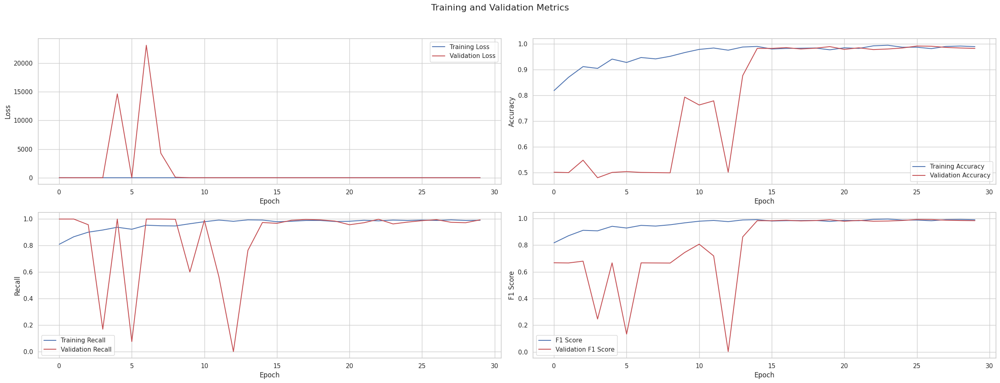

In [45]:
import seaborn as sns

# Assuming you've already read the CSV file into the 'hist' variable

sns.set(style="whitegrid")
plt.figure(figsize=(25, 10))
plt.suptitle('Training and Validation Metrics', fontsize=16)

# Training and Validation Loss
plt.subplot(2, 2, 1)
plt.plot(epoch, loss, 'b', label='Training Loss')
plt.plot(epoch, val_loss, 'r', label='Validation Loss')
#plt.title('Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Training and Validation Dice Coef Liver
plt.subplot(2, 2, 2)
plt.plot(epoch, acc, 'b', label='Training Accuracy')
plt.plot(epoch, val_acc, 'r', label='Validation Accuracy')
#plt.title('Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Training and Validation Dice Coef Tumor
plt.subplot(2, 2, 3)
plt.plot(epoch, recall, 'b', label='Training Recall')
plt.plot(epoch, val_recall, 'r', label='Validation Recall')
#plt.title('Recall')
plt.xlabel('Epoch')
plt.ylabel('Recall')
plt.legend()

# Training and Validation IOU Tumor
plt.subplot(2, 2, 4)
plt.plot(epoch, f1, 'b', label='F1 Score')
plt.plot(epoch, f1_val, 'r', label='Validation F1 Score')

plt.xlabel('Epoch')
plt.ylabel('F1 Score')
plt.legend()



# Adjust layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()